# MediaPipe Portrait Analysis

Exploration of MediaPipe for:
- Detecting portraits (people as main subject)
- Eye state detection (open/closed)
- Smile detection

**MediaPipe Version**: 0.10.31  
**Test Images**: User-provided (place in `test_images/` directory)

# ⚠️ SETUP REQUIRED

**Dependencies**: This notebook requires specific versions:
- MediaPipe 0.10.9 (with `solutions` API)
- NumPy 1.x (OpenCV compatibility)

**To fix:**
1. **Restart this Jupyter kernel** (Kernel → Restart)
2. Run:
   ```
   pip install mediapipe==0.10.9 "numpy<2.0"
   ```
3. Restart kernel again
4. Run the cells below

# ⚠️ SETUP REQUIRED

**Dependencies**: This notebook requires specific versions:
- MediaPipe 0.10.9 (with `solutions` API)
- NumPy 1.x (OpenCV compatibility)

**To fix:**
1. **Restart this Jupyter kernel** (Kernel → Restart)
2. Run:
   ```
   pip install mediapipe==0.10.9 "numpy<2.0"
   ```
3. Restart kernel again
4. Run the cells below

# ⚠️ SETUP REQUIRED

**Dependencies**: This notebook requires specific versions:
- MediaPipe 0.10.9 (with `solutions` API)
- NumPy 1.x (OpenCV compatibility)

**To fix:**
1. **Restart this Jupyter kernel** (Kernel → Restart)
2. Run:
   ```
   pip install mediapipe==0.10.9 "numpy<2.0"
   ```
3. Restart kernel again
4. Run the cells below

## 1. Setup and Imports

In [ ]:
import sys
from pathlib import Path
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from typing import Tuple, List, Dict, Optional

# MediaPipe setup
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Configure matplotlib
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print(f"MediaPipe: {mp.__version__}")
print(f"OpenCV: {cv2.__version__}")
print("Setup complete!")

MediaPipe: 0.10.9
OpenCV: 4.9.0
Setup complete!


## 2. Configuration Parameters

In [ ]:
# ============================================================================
# IMAGE PATHS
# ============================================================================
# Main image directory for batch processing
IMAGE_DIR = Path("D:\\Budapest2025_Google")

# Output directory for results
OUTPUT_DIR = Path("outputs")

# ============================================================================
# FACE DETECTION
# ============================================================================
# Minimum confidence for face detection (0.0 - 1.0)
FACE_DETECTION_CONFIDENCE = 0.5

# ============================================================================
# PORTRAIT CLASSIFICATION
# ============================================================================
# Face must occupy more than this percentage of image area to be a portrait
PORTRAIT_FACE_RATIO_THRESHOLD = 0.0005  # 15%

# Face center must be within this fraction of image center
PORTRAIT_CENTER_OFFSET_THRESHOLD = 0.3  # 30%

# ============================================================================
# EYE STATE DETECTION
# ============================================================================
# Eye Aspect Ratio (EAR) threshold
# Eyes with EAR >= threshold are considered open
# Lower values = more sensitive (easier to trigger "open")
EYE_OPEN_EAR_THRESHOLD = 0.2

# ============================================================================
# SMILE DETECTION
# ============================================================================
# Mouth width ratio threshold (relative to face width)
SMILE_WIDTH_THRESHOLD = 0.15

# Mouth corner elevation threshold (how much corners are raised)
SMILE_ELEVATION_THRESHOLD = 0.005

# ============================================================================
# VISUALIZATION
# ============================================================================
# Number of sample images to display in grids
NUM_SAMPLE_IMAGES = 10

print("Configuration loaded!")
print(f"Image directory: {IMAGE_DIR}")
print(f"Portrait thresholds: face_ratio > {PORTRAIT_FACE_RATIO_THRESHOLD}, center_offset < {PORTRAIT_CENTER_OFFSET_THRESHOLD}")
print(f"Eye EAR threshold: {EYE_OPEN_EAR_THRESHOLD}")
print(f"Smile thresholds: width > {SMILE_WIDTH_THRESHOLD}, elevation > {SMILE_ELEVATION_THRESHOLD}")
print(f"Sample images to show: {NUM_SAMPLE_IMAGES}")

Configuration loaded!
Image directory: D:\Budapest2025_Google
Portrait thresholds: face_ratio > 0.0005, center_offset < 0.3
Eye EAR threshold: 0.2
Smile thresholds: width > 0.15, elevation > 0.005
Sample images to show: 10


In [ ]:
import sys
from pathlib import Path
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from typing import Tuple, List, Dict, Optional

# MediaPipe setup
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Configure matplotlib
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print(f"MediaPipe: {mp.__version__}")
print(f"OpenCV: {cv2.__version__}")
print("Setup complete!")

MediaPipe: 0.10.9
OpenCV: 4.9.0
Setup complete!


In [ ]:
## 3. Helper Functions

In [ ]:
def euclidean_distance(point1: Tuple[float, float], point2: Tuple[float, float]) -> float:
    """Calculate Euclidean distance between two points."""
    return np.sqrt((point1[0] - point2[0])**2 + (point1[1] - point2[1])**2)


def load_image(image_path: Path) -> np.ndarray:
    """Load image and convert from BGR to RGB."""
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def get_landmark_coords(landmark, image_shape) -> Tuple[int, int]:
    """Convert normalized landmark coordinates to pixel coordinates."""
    h, w = image_shape[:2]
    x = int(landmark.x * w)
    y = int(landmark.y * h)
    return (x, y)

print("Helper functions defined!")

Helper functions defined!


## 4. Face Detection and Portrait Identification

In [ ]:
def is_portrait(face_bbox, image_shape) -> Tuple[bool, float, float]:
    """
    Determine if image is a portrait based on face size and position.
    
    Args:
        face_bbox: Face bounding box (xmin, ymin, width, height) in pixels
        image_shape: Image shape (height, width, channels)
    
    Returns:
        (is_portrait, face_ratio, center_offset)
    """
    img_height, img_width = image_shape[:2]
    
    # Calculate face area ratio
    face_area = face_bbox[2] * face_bbox[3]
    image_area = img_width * img_height
    face_ratio = face_area / image_area
    
    # Calculate face center position
    face_center_x = face_bbox[0] + face_bbox[2] / 2
    image_center_x = img_width / 2
    center_offset = abs(face_center_x - image_center_x) / img_width
    
    # Portrait criteria (configured at top of notebook)
    is_portrait_flag = (face_ratio > PORTRAIT_FACE_RATIO_THRESHOLD and 
                        center_offset < PORTRAIT_CENTER_OFFSET_THRESHOLD)
    
    return is_portrait_flag, face_ratio, center_offset


def detect_faces(image: np.ndarray, min_confidence: float = None) -> List[Dict]:
    """
    Detect faces in image using MediaPipe Face Detection.
    
    Returns list of dictionaries with face info:
    - bbox: (x, y, width, height) in pixels
    - confidence: detection confidence
    - is_portrait: whether this is a portrait
    """
    if min_confidence is None:
        min_confidence = FACE_DETECTION_CONFIDENCE
    
    with mp_face_detection.FaceDetection(
        model_selection=1,  # 1 = full-range model (better for photos)
        min_detection_confidence=min_confidence
    ) as face_detection:
        
        results = face_detection.process(image)
        
        faces = []
        if results.detections:
            for detection in results.detections:
                # Get bounding box
                bbox = detection.location_data.relative_bounding_box
                h, w = image.shape[:2]
                
                x = int(bbox.xmin * w)
                y = int(bbox.ymin * h)
                width = int(bbox.width * w)
                height = int(bbox.height * h)
                
                bbox_pixels = (x, y, width, height)
                
                # Check if portrait
                portrait, face_ratio, center_offset = is_portrait(bbox_pixels, image.shape)
                
                faces.append({
                    'bbox': bbox_pixels,
                    'confidence': detection.score[0],
                    'is_portrait': portrait,
                    'face_ratio': face_ratio,
                    'center_offset': center_offset
                })
        
        return faces

print("Face detection functions defined!")

Face detection functions defined!


## 5. Eye State Detection (Eye Aspect Ratio)

In [ ]:
# MediaPipe Face Mesh landmark indices for eyes
# Left eye: 33, 160, 158, 133, 153, 144
# Right eye: 362, 385, 387, 263, 373, 380

LEFT_EYE_INDICES = [33, 160, 158, 133, 153, 144]
RIGHT_EYE_INDICES = [362, 385, 387, 263, 373, 380]


def calculate_eye_aspect_ratio(eye_landmarks: List[Tuple[float, float]]) -> float:
    """
    Calculate Eye Aspect Ratio (EAR).
    
    EAR = (||p2-p6|| + ||p3-p5||) / (2 * ||p1-p4||)
    
    Args:
        eye_landmarks: List of 6 eye landmark coordinates [(x,y), ...]
    
    Returns:
        EAR value (typically 0.15-0.25 for open eyes, <0.15 for closed)
    """
    # Vertical distances
    v1 = euclidean_distance(eye_landmarks[1], eye_landmarks[5])
    v2 = euclidean_distance(eye_landmarks[2], eye_landmarks[4])
    
    # Horizontal distance
    h = euclidean_distance(eye_landmarks[0], eye_landmarks[3])
    
    # EAR calculation
    ear = (v1 + v2) / (2.0 * h)
    
    return ear


def detect_eye_state(image: np.ndarray, ear_threshold: float = None) -> Dict:
    """
    Detect eye state (open/closed) using Face Mesh.
    
    Returns dict with:
    - has_face: bool
    - left_eye_open: bool
    - right_eye_open: bool
    - left_ear: float
    - right_ear: float
    - landmarks: face mesh landmarks (if detected)
    """
    if ear_threshold is None:
        ear_threshold = EYE_OPEN_EAR_THRESHOLD
    
    with mp_face_mesh.FaceMesh(
        static_image_mode=True,
        max_num_faces=1,
        refine_landmarks=True,
        min_detection_confidence=0.5
    ) as face_mesh:
        
        results = face_mesh.process(image)
        
        if not results.multi_face_landmarks:
            return {'has_face': False}
        
        # Get first face landmarks
        landmarks = results.multi_face_landmarks[0]
        
        # Extract eye coordinates
        left_eye_coords = [get_landmark_coords(landmarks.landmark[i], image.shape) 
                          for i in LEFT_EYE_INDICES]
        right_eye_coords = [get_landmark_coords(landmarks.landmark[i], image.shape)
                           for i in RIGHT_EYE_INDICES]
        
        # Calculate EAR for both eyes
        left_ear = calculate_eye_aspect_ratio(left_eye_coords)
        right_ear = calculate_eye_aspect_ratio(right_eye_coords)
        
        return {
            'has_face': True,
            'left_eye_open': left_ear >= ear_threshold,
            'right_eye_open': right_ear >= ear_threshold,
            'left_ear': left_ear,
            'right_ear': right_ear,
            'landmarks': landmarks,
            'left_eye_coords': left_eye_coords,
            'right_eye_coords': right_eye_coords
        }

print("Eye state detection functions defined!")

Eye state detection functions defined!


## 6. Smile Detection

In [ ]:
# Mouth landmark indices
MOUTH_LEFT_CORNER = 61
MOUTH_RIGHT_CORNER = 291
MOUTH_TOP = 0
MOUTH_BOTTOM = 17
UPPER_LIP_TOP = 13
LOWER_LIP_BOTTOM = 14


def detect_smile(landmarks, image_shape, 
                 width_threshold: float = None,
                 elevation_threshold: float = None) -> Dict:
    """
    Detect smile based on mouth landmarks.
    
    Args:
        landmarks: Face mesh landmarks
        image_shape: Image shape
        width_threshold: Threshold for mouth width ratio
        elevation_threshold: Threshold for mouth corner elevation
    
    Returns dict with:
    - is_smiling: bool
    - smile_score: float (0-1)
    - mouth_width_ratio: float
    - corner_elevation: float
    """
    if width_threshold is None:
        width_threshold = SMILE_WIDTH_THRESHOLD
    if elevation_threshold is None:
        elevation_threshold = SMILE_ELEVATION_THRESHOLD
    
    # Get key mouth landmarks
    left_corner = get_landmark_coords(landmarks.landmark[MOUTH_LEFT_CORNER], image_shape)
    right_corner = get_landmark_coords(landmarks.landmark[MOUTH_RIGHT_CORNER], image_shape)
    mouth_top = get_landmark_coords(landmarks.landmark[MOUTH_TOP], image_shape)
    mouth_bottom = get_landmark_coords(landmarks.landmark[MOUTH_BOTTOM], image_shape)
    
    # Calculate mouth width
    mouth_width = euclidean_distance(left_corner, right_corner)
    
    # Calculate face width (approximate from landmarks)
    # Using outer eye corners as reference
    left_eye_outer = get_landmark_coords(landmarks.landmark[33], image_shape)
    right_eye_outer = get_landmark_coords(landmarks.landmark[263], image_shape)
    face_width = euclidean_distance(left_eye_outer, right_eye_outer) * 1.5
    
    mouth_width_ratio = mouth_width / face_width
    
    # Calculate corner elevation (how much corners are raised)
    # Compare to center of mouth
    mouth_center_y = (mouth_top[1] + mouth_bottom[1]) / 2
    left_elevation = (mouth_center_y - left_corner[1]) / image_shape[0]
    right_elevation = (mouth_center_y - right_corner[1]) / image_shape[0]
    avg_elevation = (left_elevation + right_elevation) / 2
    
    # Calculate lip separation
    lip_separation = euclidean_distance(mouth_top, mouth_bottom) / image_shape[0]
    
    # Combine metrics for smile score
    # Width is most important, elevation is secondary, separation is minor
    smile_score = (
        mouth_width_ratio * 0.5 + 
        max(0, avg_elevation) * 0.3 + 
        lip_separation * 0.2
    )
    
    # Normalize to 0-1
    smile_score = min(1.0, max(0.0, smile_score))
    
    is_smiling = (mouth_width_ratio > width_threshold and avg_elevation > elevation_threshold)
    
    return {
        'is_smiling': is_smiling,
        'smile_score': smile_score,
        'mouth_width_ratio': mouth_width_ratio,
        'corner_elevation': avg_elevation,
        'lip_separation': lip_separation,
        'mouth_coords': {
            'left_corner': left_corner,
            'right_corner': right_corner,
            'top': mouth_top,
            'bottom': mouth_bottom
        }
    }

print("Smile detection functions defined!")

Smile detection functions defined!


## 7. Combined Analysis Pipeline

In [ ]:
def analyze_image(image_path: Path) -> Dict:
    """
    Perform complete portrait analysis on an image.
    
    Returns dict with all analysis results:
    - image_path: str
    - has_faces: bool
    - num_faces: int
    - is_portrait: bool (if single face)
    - faces: list of face detection results
    - eyes: eye state results (if face detected)
    - smile: smile detection results (if face detected)
    """
    # Load image
    image = load_image(image_path)
    
    # Detect faces
    faces = detect_faces(image)
    
    result = {
        'image_path': str(image_path),
        'image_shape': image.shape,
        'has_faces': len(faces) > 0,
        'num_faces': len(faces),
        'faces': faces
    }
    
    # For portraits with single face, analyze eyes and smile
    if len(faces) == 1 and faces[0]['is_portrait']:
        result['is_portrait'] = True
        
        # Analyze eyes
        eye_state = detect_eye_state(image)
        result['eyes'] = eye_state
        
        # Analyze smile (if landmarks detected)
        if eye_state.get('has_face') and eye_state.get('landmarks'):
            smile_result = detect_smile(eye_state['landmarks'], image.shape)
            result['smile'] = smile_result
        else:
            result['smile'] = {'is_smiling': None, 'smile_score': None}
    else:
        result['is_portrait'] = False
        result['eyes'] = {'has_face': False}
        result['smile'] = {'is_smiling': None}
    
    return result


def analyze_batch(image_dir: Path, pattern: str = "*.jpg") -> pd.DataFrame:
    """
    Analyze a batch of images and return results as DataFrame.
    
    Args:
        image_dir: Directory containing images
        pattern: Glob pattern for image files (e.g., "*.jpg", "*.png")
    
    Returns:
        DataFrame with columns:
        - image_path
        - is_portrait
        - num_faces
        - left_eye_open
        - right_eye_open
        - is_smiling
        - ear_left
        - ear_right
        - smile_score
    """
    image_paths = list(image_dir.glob(pattern))
    if not image_paths:
        print(f"No images found in {image_dir} with pattern {pattern}")
        return pd.DataFrame()
    
    print(f"Analyzing {len(image_paths)} images...")
    
    results = []
    for img_path in image_paths:
        try:
            analysis = analyze_image(img_path)
            
            row = {
                'image_path': analysis['image_path'],
                'image_name': img_path.name,
                'has_face': analysis['has_faces'],
                'num_faces': analysis['num_faces'],
                'is_portrait': analysis['is_portrait'],
                'face_ratio': analysis['faces'][0]['face_ratio'] if analysis['faces'] else None,
                'center_offset': analysis['faces'][0]['center_offset'] if analysis['faces'] else None,
                'left_eye_open': analysis['eyes'].get('left_eye_open'),
                'right_eye_open': analysis['eyes'].get('right_eye_open'),
                'left_ear': analysis['eyes'].get('left_ear'),
                'right_ear': analysis['eyes'].get('right_ear'),
                'is_smiling': analysis['smile'].get('is_smiling'),
                'mouth_width_ratio': analysis['smile'].get('mouth_width_ratio'),
                'corner_elevation': analysis['smile'].get('corner_elevation'),
                'smile_score': analysis['smile'].get('smile_score'),
            }
            
            results.append(row)
            
        except Exception as e:
            print(f"Error processing {img_path.name}: {e}")
            results.append({
                'image_path': str(img_path),
                'image_name': img_path.name,
                'error': str(e)
            })
    
    df = pd.DataFrame(results)
    return df

print("Combined analysis functions defined!")

Combined analysis functions defined!


## 8. Visualization Functions

In [51]:
def visualize_analysis(image_path: Path, analysis: Dict, save_path: Optional[Path] = None):
    """
    Visualize portrait analysis results.
    
    Shows original image with annotations:
    - Face bounding box
    - Eye landmarks and state
    - Mouth landmarks and smile indicator
    """
    image = load_image(image_path)
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(image)
    ax.axis('off')
    
    # Draw face bounding boxes
    for face in analysis.get('faces', []):
        bbox = face['bbox']
        rect = plt.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3],
                            fill=False, color='green', linewidth=2)
        ax.add_patch(rect)
        
        # Add face info text
        text = f"Face (conf: {face['confidence']:.2f})"
        if face['is_portrait']:
            text += "\nPortrait!"
        ax.text(bbox[0], bbox[1] - 10, text, 
               color='green', fontsize=10, 
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Draw eye landmarks and state
    if analysis['eyes'].get('has_face'):
        eyes = analysis['eyes']
        
        # Left eye
        left_eye = eyes.get('left_eye_coords', [])
        if left_eye:
            for point in left_eye:
                ax.plot(point[0], point[1], 'co', markersize=3)
            
            # Eye state label
            left_state = "Open" if eyes.get('left_eye_open') else "Closed"
            left_ear = eyes.get('left_ear', 0)
            if left_eye:
                center = left_eye[0]
                ax.text(center[0] - 30, center[1], 
                       f"L: {left_state}\nEAR: {left_ear:.3f}",
                       color='cyan', fontsize=9,
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        # Right eye
        right_eye = eyes.get('right_eye_coords', [])
        if right_eye:
            for point in right_eye:
                ax.plot(point[0], point[1], 'mo', markersize=3)
            
            # Eye state label
            right_state = "Open" if eyes.get('right_eye_open') else "Closed"
            right_ear = eyes.get('right_ear', 0)
            if right_eye:
                center = right_eye[0]
                ax.text(center[0] + 10, center[1],
                       f"R: {right_state}\nEAR: {right_ear:.3f}",
                       color='magenta', fontsize=9,
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Draw mouth landmarks and smile state
    if analysis['smile'].get('mouth_coords'):
        mouth = analysis['smile']['mouth_coords']
        
        # Draw mouth corners and edges
        ax.plot([mouth['left_corner'][0], mouth['right_corner'][0]], 
               [mouth['left_corner'][1], mouth['right_corner'][1]],
               'y-', linewidth=2)
        ax.plot(mouth['left_corner'][0], mouth['left_corner'][1], 'yo', markersize=5)
        ax.plot(mouth['right_corner'][0], mouth['right_corner'][1], 'yo', markersize=5)
        
        # Smile state label
        smile_state = "Smiling!" if analysis['smile'].get('is_smiling') else "Neutral"
        smile_score = analysis['smile'].get('smile_score', 0)
        ax.text(mouth['left_corner'][0], mouth['bottom'][1] + 30,
               f"{smile_state}\nScore: {smile_score:.3f}",
               color='yellow', fontsize=10,
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Add overall result as title
    title = f"Analysis: {Path(image_path).name}\n"
    if analysis['is_portrait']:
        title += "Portrait detected"
    else:
        title += f"Not a portrait ({analysis['num_faces']} faces)"
    ax.set_title(title, fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Saved visualization to {save_path}")
    
    plt.show()


def visualize_batch_grid(df: pd.DataFrame, image_dir: Path, max_images: int = 12):
    """
    Visualize a grid of analyzed images with their results.
    """
    # Filter to portraits only
    portraits = df[df['is_portrait'] == True].head(max_images)
    
    if len(portraits) == 0:
        print("No portraits found in results")
        return
    
    n = len(portraits)
    cols = 4
    rows = (n + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
    axes = axes.flatten() if n > 1 else [axes]
    
    for idx, (_, row) in enumerate(portraits.iterrows()):
        if idx >= len(axes):
            break
        
        ax = axes[idx]
        
        # Load and display image
        img_path = image_dir / row['image_name']
        try:
            img = load_image(img_path)
            ax.imshow(img)
        except:
            ax.text(0.5, 0.5, 'Image not found', ha='center', va='center')
        
        # Create result label
        eyes_open = []
        if row.get('left_eye_open'):
            eyes_open.append('L')
        if row.get('right_eye_open'):
            eyes_open.append('R')
        
        eyes_str = '+'.join(eyes_open) if eyes_open else "Both closed"
        smile_str = "Smiling" if row.get('is_smiling') else "Neutral"
        
        title = f"{row['image_name']}\nEyes: {eyes_str} | {smile_str}"
        ax.set_title(title, fontsize=9)
        ax.axis('off')
    
    # Hide unused subplots
    for idx in range(len(portraits), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

print("Visualization functions defined!")

Visualization functions defined!


## 9. Usage Example

Place your test images in the `test_images/` directory and run the cells below.

In [ ]:
# Use configured image directory from top of notebook
test_images_dir = IMAGE_DIR

# Check if directory exists and has images
if not test_images_dir.exists():
    print(f"Directory not found: {test_images_dir}")
    print("Please create the directory and add test images")
else:
    image_files = list(test_images_dir.glob("*.jpg")) + list(test_images_dir.glob("*.png")) + list(test_images_dir.glob("*.JPG"))
    print(f"Found {len(image_files)} images in {test_images_dir}")
    if image_files:
        print("Sample images:")
        for img in image_files[:5]:
            print(f"  - {img.name}")

Found 244 images in D:\Budapest2025_Google
Sample images:
  - 20250822_112331.jpg
  - 20250822_112359.jpg
  - 20250822_112502.jpg
  - 20250822_121039.jpg
  - 20250822_121053.jpg


In [ ]:
# Analyze a single image (uncomment and specify image path)
test_image = test_images_dir / "your_image.jpg"
if test_image.exists():
    result = analyze_image(test_image)
    print(json.dumps({k: str(v) if not isinstance(v, (dict, list)) else v 
                      for k, v in result.items()}, indent=2))
    visualize_analysis(test_image, result)

In [54]:
# Analyze all images in directory
if test_images_dir.exists() and len(image_files) > 0:
    # Analyze batch
    results_df = analyze_batch(test_images_dir, "*.jpg")
    
    # Also check for PNG files
    if len(list(test_images_dir.glob("*.png"))) > 0:
        results_png = analyze_batch(test_images_dir, "*.png")
        results_df = pd.concat([results_df, results_png], ignore_index=True)
    
    # Display results
    print("\n" + "="*80)
    print("RESULTS SUMMARY")
    print("="*80)
    print(f"\nTotal images analyzed: {len(results_df)}")
    print(f"Portraits detected: {results_df['is_portrait'].sum()}")
    
    if results_df['is_portrait'].sum() > 0:
        portraits = results_df[results_df['is_portrait'] == True]
        print(f"\nPortrait Statistics:")
        print(f"  Eyes open (both): {((portraits['left_eye_open'] == True) & (portraits['right_eye_open'] == True)).sum()}")
        print(f"  Eyes closed (both): {((portraits['left_eye_open'] == False) & (portraits['right_eye_open'] == False)).sum()}")
        print(f"  Smiling: {(portraits['is_smiling'] == True).sum()}")
        print(f"  Neutral expression: {(portraits['is_smiling'] == False).sum()}")
    
    # Display dataframe
    print("\nDetailed Results:")
    display(results_df)
    
    # Save results
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    output_path = OUTPUT_DIR / "analysis_results.csv"
    results_df.to_csv(output_path, index=False)
    print(f"\nResults saved to: {output_path}")
else:
    print("No images to analyze. Please add images to test_images/ directory.")

Analyzing 122 images...



RESULTS SUMMARY

Total images analyzed: 122
Portraits detected: 70

Portrait Statistics:
  Eyes open (both): 11
  Eyes closed (both): 2
  Smiling: 9
  Neutral expression: 5

Detailed Results:


,image_path,image_name,has_face,num_faces,is_portrait,face_ratio,center_offset,left_eye_open,right_eye_open,left_ear,right_ear,is_smiling,mouth_width_ratio,corner_elevation,smile_score
0,D:\Budapest2025_Google\20250822_112331.jpg,20250822_112331.jpg,True,1,True,0.023663,0.079585,True,True,0.312407,0.340386,True,0.479050,0.011894,0.247975
1,D:\Budapest2025_Google\20250822_112359.jpg,20250822_112359.jpg,True,1,True,0.003238,0.025369,None,None,NaN,NaN,None,NaN,NaN,NaN
2,D:\Budapest2025_Google\20250822_112502.jpg,20250822_112502.jpg,True,1,True,0.021123,0.030565,True,True,0.258163,0.305767,True,0.451805,0.008326,0.232432
3,D:\Budapest2025_Google\20250822_121039.jpg,20250822_121039.jpg,True,1,True,0.002570,0.086938,None,None,NaN,NaN,None,NaN,NaN,NaN
4,D:\Budapest2025_Google\20250822_121053.jpg,20250822_121053.jpg,True,2,False,0.002275,0.077134,None,None,NaN,NaN,None,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,D:\Budapest2025_Google\20250824_170810.jpg,20250824_170810.jpg,False,0,False,NaN,NaN,None,None,NaN,NaN,None,NaN,NaN,NaN
118,D:\Budapest2025_Google\20250824_170831.jpg,20250824_170831.jpg,False,0,False,NaN,NaN,None,None,NaN,NaN,None,NaN,NaN,NaN
119,D:\Budapest2025_Google\20250824_170838.jpg,20250824_170838.jpg,False,0,False,NaN,NaN,None,None,NaN,NaN,None,NaN,NaN,NaN
120,D:\Budapest2025_Google\20250824_191011.jpg,20250824_191011.jpg,False,0,False,NaN,NaN,None,None,NaN,NaN,None,NaN,NaN,NaN



Results saved to: outputs\analysis_results.csv


In [ ]:
## 10. Detailed Image Analysis

# Show samples with detection metrics: smiling, not smiling, eyes open, eyes closed

In [56]:
# Show detection thresholds
print("DETECTION CRITERIA:")
print()
print("SMILE:")
print(f"  Width threshold: {SMILE_WIDTH_THRESHOLD}")
print(f"  Elevation threshold: {SMILE_ELEVATION_THRESHOLD}")
print(f"  Decision: BOTH width > {SMILE_WIDTH_THRESHOLD} AND elevation > {SMILE_ELEVATION_THRESHOLD}")
print()
print("EYE STATE:")
print(f"  EAR threshold: {EYE_OPEN_EAR_THRESHOLD}")
print(f"  Decision: EAR >= {EYE_OPEN_EAR_THRESHOLD} means OPEN, EAR < {EYE_OPEN_EAR_THRESHOLD} means CLOSED")
print()

# Smiling
smiling = results_df[results_df['is_smiling'] == True].head(NUM_SAMPLE_IMAGES)

DETECTION CRITERIA:

SMILE:
  Width threshold: 0.15
  Elevation threshold: 0.005
  Decision: BOTH width > 0.15 AND elevation > 0.005

EYE STATE:
  EAR threshold: 0.2
  Decision: EAR >= 0.2 means OPEN, EAR < 0.2 means CLOSED



In [ ]:

results_df.groupby(['is_smiling']).size()

is_smiling
False    5
True     9
dtype: int64

C:\Users\Jonathan Hexner\AppData\Local\Temp\ipykernel_76204\1705872538.py:16: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
d:\sim-bench\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


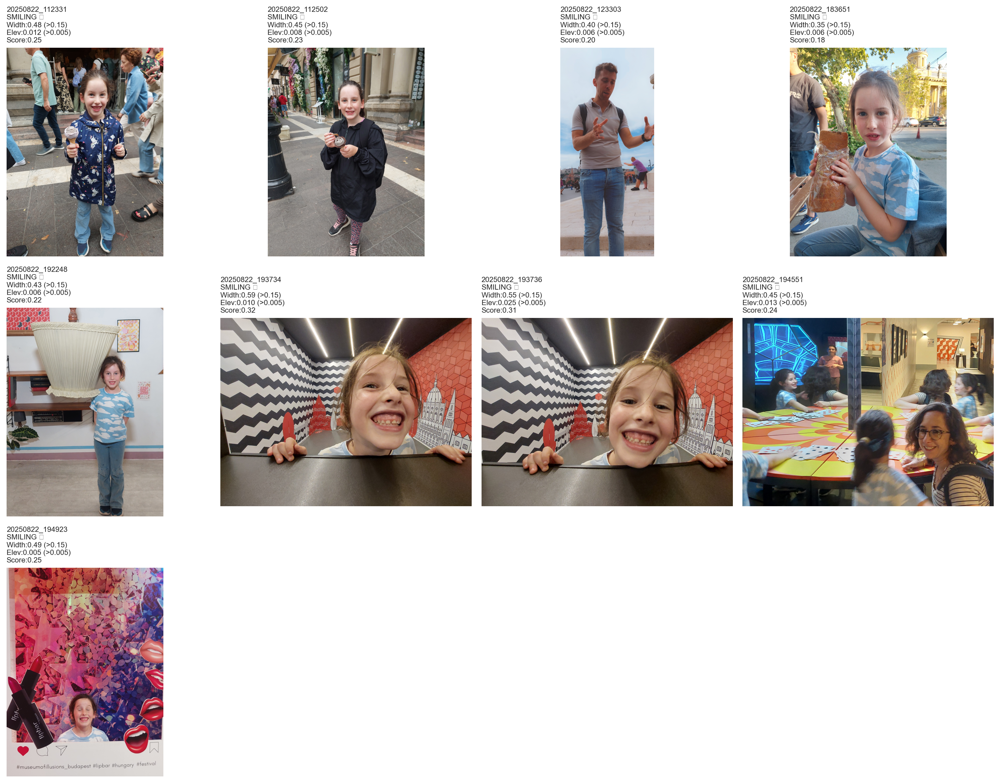

C:\Users\Jonathan Hexner\AppData\Local\Temp\ipykernel_76204\1705872538.py:37: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
d:\sim-bench\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


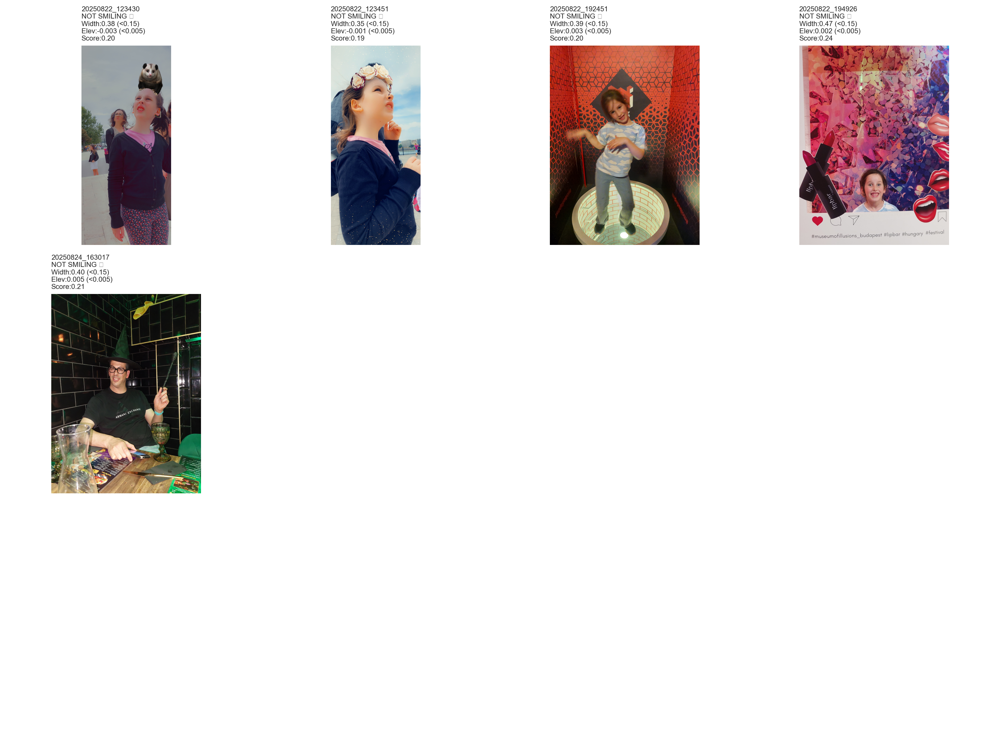

In [ ]:
# Smiling
smiling = results_df[results_df['is_smiling'] == True].head(NUM_SAMPLE_IMAGES)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for idx, (_, row) in enumerate(smiling.iterrows()):
    img = load_image(test_images_dir / row['image_name'])
    axes[idx].imshow(img)
    title = f"{row['image_name'][:15]}\nSMILING ✓\n"
    title += f"Width:{row['mouth_width_ratio']:.2f} (>{SMILE_WIDTH_THRESHOLD})\n"
    title += f"Elev:{row['corner_elevation']:.3f} (>{SMILE_ELEVATION_THRESHOLD})\n"
    title += f"Score:{row['smile_score']:.2f}"
    axes[idx].set_title(title, fontsize=8, ha='left', loc='left')
    axes[idx].axis('off')
for idx in range(len(smiling), 12):
    axes[idx].axis('off')
plt.tight_layout()
plt.show()

# Not smiling
not_smiling = results_df[(results_df['has_face'] == True) & (results_df['is_smiling'] == False)].head(NUM_SAMPLE_IMAGES)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for idx, (_, row) in enumerate(not_smiling.iterrows()):
    img = load_image(test_images_dir / row['image_name'])
    axes[idx].imshow(img)
    if row['mouth_width_ratio']:
        title = f"{row['image_name'][:15]}\nNOT SMILING ✗\n"
        title += f"Width:{row['mouth_width_ratio']:.2f} (<{SMILE_WIDTH_THRESHOLD})\n"
        title += f"Elev:{row['corner_elevation']:.3f} (<{SMILE_ELEVATION_THRESHOLD})\n"
        title += f"Score:{row['smile_score']:.2f}"
    else:
        title = f"{row['image_name'][:15]}\nNOT SMILING\nNo data"
    axes[idx].set_title(title, fontsize=8, ha='left', loc='left')
    axes[idx].axis('off')
for idx in range(len(not_smiling), 12):
    axes[idx].axis('off')
plt.tight_layout()
plt.show()

# Eyes open
eyes_open = results_df[(results_df['left_eye_open'] == True) & (results_df['right_eye_open'] == True)].head(NUM_SAMPLE_IMAGES)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for idx, (_, row) in enumerate(eyes_open.iterrows()):
    img = load_image(test_images_dir / row['image_name'])
    axes[idx].imshow(img)
    if row['left_ear'] and row['right_ear']:
        title = f"{row['image_name'][:15]}\nEYES OPEN\n"
        title += f"L:{row['left_ear']:.3f} R:{row['right_ear']:.3f}\n"
        title += f"(>={EYE_OPEN_EAR_THRESHOLD})"
    else:
        title = f"{row['image_name'][:15]}\nEYES OPEN"
    axes[idx].set_title(title, fontsize=8, ha='left', loc='left')
    axes[idx].axis('off')
for idx in range(len(eyes_open), 12):
    axes[idx].axis('off')
plt.tight_layout()
plt.show()

# Eyes closed
eyes_closed = results_df[(results_df['left_eye_open'] == False) | (results_df['right_eye_open'] == False)].head(NUM_SAMPLE_IMAGES)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for idx, (_, row) in enumerate(eyes_closed.iterrows()):
    img = load_image(test_images_dir / row['image_name'])
    axes[idx].imshow(img)
    if row['left_ear'] and row['right_ear']:
        title = f"{row['image_name'][:15]}\nEYES CLOSED\n"
        title += f"L:{row['left_ear']:.3f} R:{row['right_ear']:.3f}\n"
        title += f"(<{EYE_OPEN_EAR_THRESHOLD})"
    else:
        title = f"{row['image_name'][:15]}\nEYES CLOSED"
    axes[idx].set_title(title, fontsize=8, ha='left', loc='left')
    axes[idx].axis('off')
for idx in range(len(eyes_closed), 12):
    axes[idx].axis('off')
plt.tight_layout()
plt.show()

# No face detected
no_face = results_df[results_df['has_face'] == False].head(NUM_SAMPLE_IMAGES)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()
for idx, (_, row) in enumerate(no_face.iterrows()):
    img = load_image(test_images_dir / row['image_name'])
    axes[idx].imshow(img)
    axes[idx].set_title(f"{row['image_name'][:15]}\nNO FACE", fontsize=8)
    axes[idx].axis('off')
for idx in range(len(no_face), 12):
    axes[idx].axis('off')
plt.tight_layout()
plt.show()
plt.show()

In [ ]:
import sys
from pathlib import Path
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from typing import Tuple, List, Dict, Optional

# MediaPipe setup
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Configure matplotlib
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print(f"MediaPipe: {mp.__version__}")
print(f"OpenCV: {cv2.__version__}")
print("Setup complete!")

MediaPipe: 0.10.9
OpenCV: 4.9.0
Setup complete!


In [ ]:
import sys
from pathlib import Path
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from typing import Tuple, List, Dict, Optional

# MediaPipe setup
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Configure matplotlib
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print(f"MediaPipe: {mp.__version__}")
print(f"OpenCV: {cv2.__version__}")
print("Setup complete!")

MediaPipe: 0.10.9
OpenCV: 4.9.0
Setup complete!


In [ ]:
import sys
from pathlib import Path
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from typing import Tuple, List, Dict, Optional

# MediaPipe setup
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Configure matplotlib
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print(f"MediaPipe: {mp.__version__}")
print(f"OpenCV: {cv2.__version__}")
print("Setup complete!")

MediaPipe: 0.10.9
OpenCV: 4.9.0
Setup complete!


In [ ]:
import sys
from pathlib import Path
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from typing import Tuple, List, Dict, Optional

# MediaPipe setup
mp_face_detection = mp.solutions.face_detection
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Configure matplotlib
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print(f"MediaPipe: {mp.__version__}")
print(f"OpenCV: {cv2.__version__}")
print("Setup complete!")

MediaPipe: 0.10.9
OpenCV: 4.9.0
Setup complete!
